In [82]:
import numpy as np
import magpylib as magpy
from maggeometry import n_rings, four_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_xy_grid

### 4 rings Samwise target 10G
All variables can be optimized independently for each ring set

1. Run 50 shots using Nelder-Mead with nonuniformity cost function
2. Optimize for field strength using new cost function

In [83]:
Br = 1.09e3
mag_dir = (0,0,1)
mirror1_z = True
ringset_1_config = [Br, mag_dir, mirror1_z]

r = 1.09e3
mag_dir = (0,0,1)
mirror2_z = True
ringset_2_config = [Br, mag_dir, mirror2_z]
# innerrad, width, thickness, dist
bounds = ((1, 150), (2, 20), (2, 20), (1, 300),
          (1, 150), (2, 20), (2, 20), (1, 300))

In [84]:
def get_grid_mag_and_target_nonuniformity(magnets, grid, grid_res, target=10, use_z=False):
    mT_to_G = 10
    B = magnets.getB(grid)
    G = B * mT_to_G
    # find magnitude of the b-field at all points over grid
    Gmag = 0
    if use_z:
        Gmag = G[:,:,2]
    else:
        Gmag = np.linalg.norm(G, axis=2)
#     Gmag = np.sqrt(G[:,:,0]**2 + G[:,:,1]**2 + G[:,:,2]**2)
#     Gmag = G[:,:,2]
    # find magnitude of b-field at center of grid
    mid_id = int(grid_res/2)
    Gcenter = Gmag[mid_id][mid_id]
    # calculate nonuniformity with respect to center b-field
    Gnon = np.abs((Gmag - Gcenter)/Gcenter)
    Gtarget_non = np.abs((Gmag - target)/target)
#     Gtarget_non = np.abs((Gmag - target)/target)
#     max_nonuniformity = np.max(Gnon)
    av_nonuniformity = np.sum(Gnon) / grid_res**2
    av_target_nonuniformity = np.sum(Gtarget_non) / grid_res**2
#     return Gmag, Gnon, Gcenter, av_nonuniformity, av_target_nonuniformity, max_nonuniformity
    return Gcenter, av_nonuniformity, av_target_nonuniformity

In [85]:
grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
threshold = 0.1 # in G
target = 10
def obj1_nonuniformity(x):
    obj_ring_config=[[*ringset_1_config, *x[0:4]], [*ringset_2_config, *x[4:8]]]
    magnets = n_rings(obj_ring_config)
#     grid_field, nonun, center_field, av_nonuniformity, av_target_nonuniformity, max_abs_nonuniformity = get_grid_mag_and_target_nonuniformity(magnets, grid, grid_res)
    center_field, av_nonuniformity, av_target_nonuniformity = get_grid_mag_and_target_nonuniformity(magnets, grid, grid_res, target)
    if (abs(center_field - target) > threshold):
        return av_target_nonuniformity
    return av_nonuniformity

In [86]:
import numpy as np
from scipy.optimize import minimize, Bounds
from maggeometry import n_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_grid
from alive_progress import alive_bar

options = {'disp': True, 'fatol': 1e-18, 'maxiter': 5e3, 'adaptive': True}
method = "Nelder-Mead"

shots = 50
results_x = []
results_fun = []
guesses_x0 = []
with alive_bar(shots, force_tty=True) as bar:
    for i in range(shots):
        x0 = np.zeros(len(bounds))
        for b in range(len(bounds)):
            x0[b] = np.random.uniform(low=bounds[b][0], high=bounds[b][1])
#         if (x0[7] < x0[3]):
#             x0[3], x0[7] = x0[7], x0[3]
        res = minimize(obj1_nonuniformity, x0, method=method, options=options, bounds=bounds)
        guesses_x0.append(x0)
        results_x.append(res.x)
        results_fun.append(res.fun)
        bar()

print("Objective function values:")
print(results_fun)
print("Result parameters:")
print(results_x)
print("Starting guesses:")
print(guesses_x0)

on 0: /var/folders/06/7pjfbw510cz2ch1m7lx8vvl80000gn/T/ipykernel_4086/245155015.py:21: RuntimeWarning:
      
      Maximum number of iterations has been exceeded.


|████████████████████████████████████████| 50/50 [100%] in 10:27:35.6 (0.00/s)  
Objective function values:
[0.004968324786228895, 4.550021676092693e-09, 0.004673509989957958, 2.584771517479109e-06, 0.004482892977756066, 7.998183272817805e-07, 8.864192776377459e-07, 0.004654447312554052, 4.9371454298650765e-06, 0.00471350088269698, 3.191876149361336e-06, 0.004495903168973685, 9.609892831697776e-07, 8.187423949531959e-07, 0.004471420687828494, 8.319843738147122e-07, 0.005088695231712213, 0.004477511142044418, 6.866471620409549e-08, 6.716690198275337e-06, 4.8223083343071545e-09, 0.004272461317008287, 0.00509093337628536, 0.004540928755035472, 0.004468649499725602, 1.6751128460225492e-06, 1.546156922384044e-05, 2.8075175521395886e-07, 3.414688306418103e-09, 1.1896099249866203e-07, 0.004441449578788725, 0.0044785026679896025, 0.004470535729771511, 0.004465649111727908, 8.682454067806797e-07, 1.013676988724096e-06, 0.004778070275951357, 8.820866469858995e-07, 0.004513670138092967, 0.0044715

In [87]:
from maggeometry import n_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_xy_grid
grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
results_g_center = []
results_nonun = []
for x in results_x:
    obj_ring_config=[[*ringset_1_config, *x[0:4]], [*ringset_2_config, *x[4:8]]]
    magnets = n_rings(obj_ring_config)
    grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
    results_g_center.append(center_field)
    results_nonun.append(av_nonuniformity)
print(results_g_center)
print(results_nonun)

[10.100000115163192, 9.900398623692801, 10.10000000000062, 9.900000105918325, 9.899999994604638, 9.900012152028909, 10.09999611562291, 10.100000106824092, 9.900000000008223, 10.100000000000275, 9.900000000000514, 10.100000000000282, 9.900004213684262, 9.90000000000359, 9.899999999997421, 9.919158987841076, 10.100000000000254, 9.899999999490849, 10.094955242840093, 9.900000000006669, 9.928998067161078, 10.100000316188513, 9.899999999998972, 9.899999998713831, 9.89999932546672, 9.900000000009763, 9.90000000000595, 10.05761405047668, 10.066265666146329, 9.948407010212916, 9.89999999999898, 10.100000000000273, 9.899999999999025, 10.100000000000229, 9.958206159701833, 9.99949091578423, 10.100000000000282, 9.900000469162453, 10.100000000000264, 9.899999999999709, 9.900000000008216, 9.89999999994743, 9.900000000000233, 10.100000000000279, 9.900000000005136, 9.899999999998998, 10.100000000000655, 9.899999598731739, 9.899999941674968, 9.90000000000051]
[0.007112373904762608, 4.550021676092693e-

In [89]:
from maghelper import make_opt_res_csv
import datetime
today = datetime.datetime.today().strftime('%Y_%m_%d')
b, b_df = make_opt_res_csv(f'results/4 rings/{today}_piecewise_objective_adaptive_stage1opt_4rings_1090T_', results_nonun, results_g_center, results_x, guesses_x0)

Number of unique results: 50
    nonuniformity  center_field_gauss  r_1_innerrad  r_1_width  r_1_thickness  \
0    3.414688e-09           10.066266     13.933816  16.098081       2.489490   
1    4.550022e-09            9.900399      2.278463   3.645411      19.996902   
2    4.822308e-09            9.928998     34.885039   9.691429      12.007250   
3    2.006721e-08            9.900000     43.576784  11.539817       2.845553   
4    6.866472e-08           10.094955    147.538073  16.417045       6.836740   
5    1.189610e-07            9.948407     46.842714  11.153201       6.384180   
6    2.807518e-07           10.057614    150.000000   5.120091       2.427474   
7    7.998183e-07            9.900012      1.706011   5.336924       5.959097   
8    8.187424e-07            9.900000      1.000000   2.538387       4.501033   
9    8.319844e-07            9.919159    143.950552   6.368629      19.721515   
10   8.682454e-07            9.958206      1.000002   4.882598      10.183206   

In [78]:
results2_x = []
results2_fun = []

def test_nonuniformity(x):
    obj_ring_config=[[*ringset_1_config, *x[0:4]], [*ringset_2_config, *x[4:8]]]
    magnets = n_rings(obj_ring_config)
#     grid_field, nonun, center_field, av_nonuniformity, av_target_nonuniformity, max_abs_nonuniformity = get_grid_mag_and_target_nonuniformity(magnets, grid, grid_res)
    center_field, av_nonuniformity, av_target_nonuniformity = get_grid_mag_and_target_nonuniformity(magnets, grid, grid_res, target)
#     if (abs(center_field - target) > threshold):
#         return av_target_nonuniformity
    return av_nonuniformity

with alive_bar(shots, force_tty=True) as bar:
        x0 = results_x[4]
#         for b in range(len(bounds)):
#             x0[b] = np.random.uniform(low=bounds[b][0], high=bounds[b][1])
#         if (x0[7] < x0[3]):
#             x0[3], x0[7] = x0[7], x0[3]
        res = minimize(test_nonuniformity, x0, method=method, options=options, bounds=bounds)
        results2_x.append(res.x)
        results2_fun.append(res.fun)
        bar()

on 0: Optimization terminated successfully.                                     
on 0:          Current function value: 0.000000                                 
on 0:          Iterations: 535                                                  
on 0:          Function evaluations: 1024                                       
|████⚠︎                                   | (!) 1/10 [10%] in 36.4s (0.03/s)     


In [81]:
print(results2_x)
print(results2_fun)
x2 = results2_x[0]
obj_ring_config=[[*ringset_1_config, *x2[0:4]], [*ringset_2_config, *x2[4:8]]]
magnets = n_rings(obj_ring_config)
grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
print(center_field)


[array([ 30.33265782,   6.08845687,  10.73994738, 215.89850798,
       143.1753113 ,   6.0686689 ,   7.43824662, 170.11989109])]
[3.947940886707878e-09]
9.0279009803251


results with piecewise function

threshold = 0.3

switch from optimizing diff to optimizing homogeneity

gives really good convergence to b field strength!

In [37]:
from maggeometry import n_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_xy_grid
grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
results_g_center = []
results_nonun = []
for x in results_x:
    obj_ring_config=[[*ringset_1_config, *x[0:4]], [*ringset_2_config, *x[4:8]]]
    magnets = n_rings(obj_ring_config)
    grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
    results_g_center.append(center_field)
    results_nonun.append(av_nonuniformity)
print(results_g_center)
print(results_nonun)

[9.801437289459521, 10.049042537176332, 9.700000000008453, 10.217846591751051, 10.2999290665539, 9.699999999997644]
[8.011181807396748e-07, 1.8136399115896354e-08, 2.828278568209459e-06, 9.007206771079244e-08, 7.648203910330254e-07, 0.022460447008104508]


In [39]:
print(results_x)
print(guesses_x0)

[array([  1.        ,  10.63842081,   2.8805474 , 298.17282335,
       149.99998535,  19.9999029 ,   6.93824033, 267.77652685]), array([  5.73164595,   5.62026   ,   5.05463989, 139.68816742,
       108.97840818,  12.5652557 ,   4.00875408, 156.90266153]), array([132.92764321,   6.99436756,   9.81807341, 211.91491421,
        79.70128785,   6.27415518,   2.        , 163.49547043]), array([ 81.21255017,   3.6311245 ,   2.01024462,  82.51733122,
        24.36023738,  17.72922425,   3.29396112, 165.68939446]), array([149.99779049,   5.89086199,  19.72981882, 238.72311434,
        12.12236695,   6.46114383,   2.56648286, 196.05613927]), array([116.82866972,  14.27603707,   6.92195679,  94.63643825,
        46.67867884,   2.07843725,  20.        , 181.23345685])]
[array([ 39.65682517,  11.73149763,   9.39112774, 163.9224476 ,
       126.68089923,   5.28697528,   9.45348594, 299.48835653]), array([ 12.00485927,  13.03129743,  12.27739519,  69.76229575,
        58.72515302,  12.17031232,   4.

In [12]:
from maghelper import make_opt_res_csv
today = datetime.datetime.today().strftime('%Y_%m_%d')
b, b_df = make_opt_res_csv(f'results/4 rings/{today}_adaptive_stage1opt_4rings_1090T_', results_fun, results_g_center, results_x, guesses_x0)

Number of unique results: 50
    nonuniformity  center_field_gauss  r_1_innerrad  r_1_width  r_1_thickness  \
0    1.134055e-09           42.751981     46.599539  16.297544       7.039698   
1    1.717574e-09           27.431667     93.603736  11.867787      18.112806   
2    2.908894e-09            3.543188     23.729052   4.664503      19.906640   
3    2.958583e-09            6.155185     36.898796  11.100835       2.165177   
4    3.055586e-09            8.800313    147.290318  10.450160       6.530180   
5    3.066152e-09            7.924040     30.122990   2.896567       5.513173   
6    3.093035e-09           13.222464    149.665122   3.182106      19.998862   
7    4.501418e-09           17.384327    140.164711   4.854240      14.916302   
8    6.023945e-09            8.529758    131.227743  10.745510       3.392122   
9    6.188918e-09            9.891181      4.415345  14.488275      19.999808   
10   1.028934e-08           29.808445    114.000687  14.377360      19.994293   

### PSO Optimization with objective function

In [63]:
import numpy as np
from scipy.optimize import minimize, Bounds
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_grid
from maggeometry import four_rings, n_rings
import magpylib as magpy
from magpylib.magnet import CylinderSegment
import pyswarms as ps
from pyswarms.utils.functions import single_obj as fx

Br = 1.09e3
grid_res = 101
grid = make_grid([-10, 10], [-10, 10], grid_res)

Br = 1.09e3
mag_dir = (0,0,1)
mirror1_z = True
ringset_1_config = [Br, mag_dir, mirror1_z]

r = 1.09e3
mag_dir = (0,0,1)
mirror2_z = True
ringset_2_config = [Br, mag_dir, mirror2_z]

target = 10

def obj_pso_nonuniformity(x):
    f = []
    for x_i in x:
        obj_ring_config=[[*ringset_1_config, *x_i[0:4]], [*ringset_2_config, *x_i[4:8]]]
        magnets = n_rings(obj_ring_config)
        center_field, av_nonuniformity, av_target_nonuniformity = get_grid_mag_and_target_nonuniformity(magnets, grid, grid_res, target)
        diff = abs(center_field - target)
    #     if (abs(center_field - target) > threshold):
    #         return av_target_nonuniformity
    #     return av_nonuniformity
#         f.append(av_nonuniformity * diff)
#         f.append(av_target_nonuniformity)
        f.append(av_nonuniformity)
    return f
    
# def nonuniformity(x):
#     f = []
#     for i in range(len(x)):
#         innerrad1, innerrad2, width, dist1, dist2 = x[i]
#         thickness = 2
#         magnets = four_rings(Br, innerrad1, innerrad2, width, thickness, dist1, dist2)
#         grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
#         f.append(av_nonuniformity)
#     return f

options = {'c1': 0.4, 'c2': 0.6, 'w':0.7}
# oh_strategy = {"w":'exp_decay', 'c1':'nonlin_mod', 'c2':'lin_variation'}
oh_strategy = {"w":'exp_decay', 'c1':'lin_variation', 'c2':'lin_variation'}

bounds = (np.array([1.0, 2.0, 2.0, 1.0, 1.0, 2.0, 2.0, 1.0]),
          np.array([150.0, 20.0, 20.0, 300.0, 150.0, 20.0, 20.0, 300.0]))

# Call instance of PSO
optimizer = ps.single.GlobalBestPSO(n_particles=50, dimensions=8, options=options, oh_strategy=oh_strategy, bounds=bounds)

# Perform optimization
cost, pos = optimizer.optimize(obj_pso_nonuniformity, iters=50)

2023-07-17 22:40:41,990 - pyswarms.single.global_best - INFO - Optimize for 50 iters with {'c1': 0.4, 'c2': 0.6, 'w': 0.7}
pyswarms.single.global_best: 100%|█████████████████████|50/50, best_cost=4.55e-6
2023-07-17 22:42:13,323 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 4.545093223877496e-06, best pos: [ 56.50066107  12.36335622  12.91406919 181.88438696 101.9458333
  11.37309837  12.30344958 142.5841357 ]


On x-axis:
Maximum B-field: 10.0 G
Central B-field: 10.0 G
Min nonuniformity: 0.0
Max nonuniformity:0.0009478162506474687


On y-axis:
Maximum B-field: 10.0 G
Central B-field: 10.0 G
Min nonuniformity: 0.0
Max nonuniformity:0.0009478162506474687


On z-axis:
Maximum B-field: 10.019 G
Central B-field: 10.0 G
Min nonuniformity: 0.0
Max nonuniformity:0.0018897990405874424




/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:261: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[3].set_ylim(x_min_nonuniformity - 1e-7, x_max_nonuniformity + 1e-7)
/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:267: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[4].set_ylim(y_min_nonuniformity - 1e-7, y_max_nonuniformity + 1e-7)
/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:273: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[5].set_ylim(z_min_nonuniformity - 1e-7, z_max_nonuniformity + 1e-7)


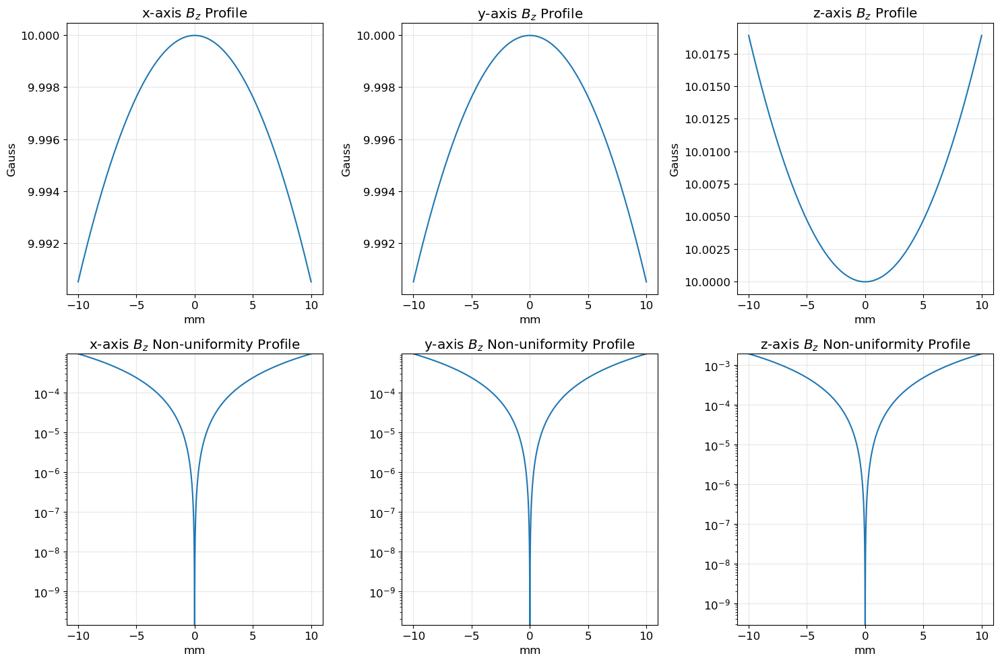

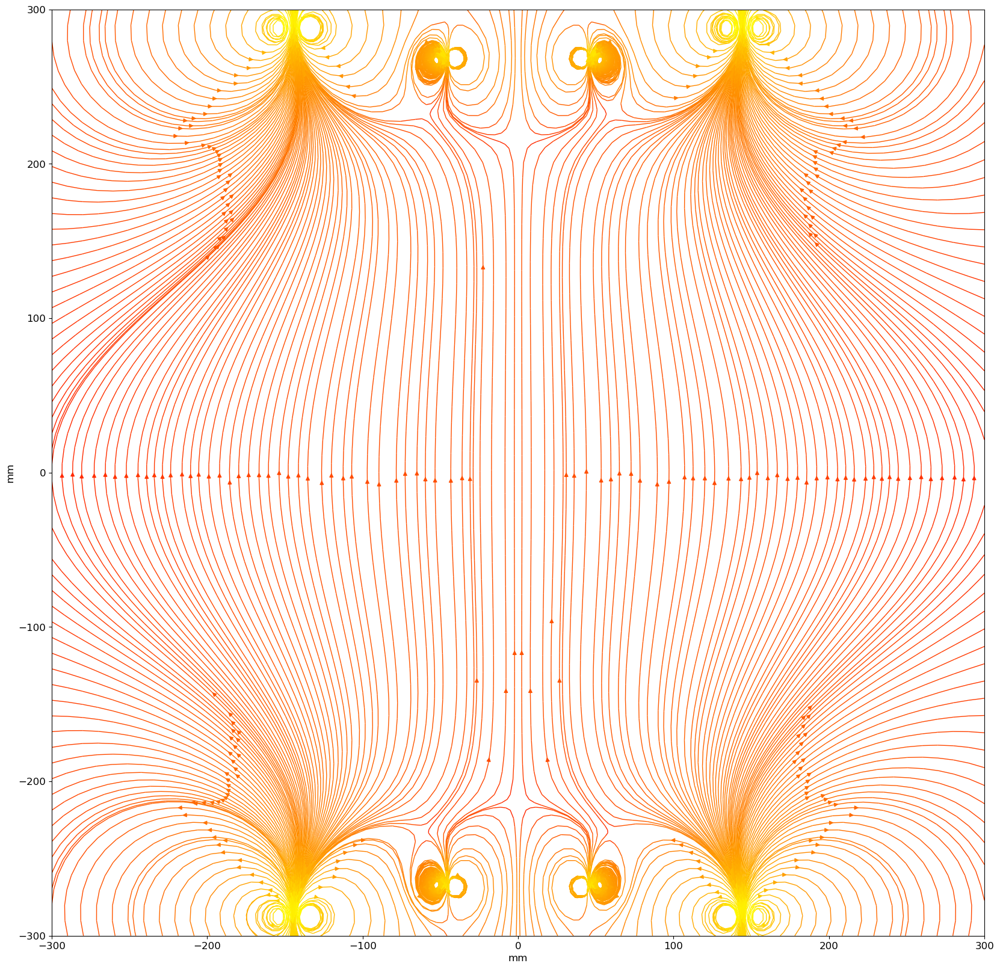

In [58]:
import numpy as np
from scipy.optimize import minimize, Bounds
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_grid
from maggeometry import n_rings
import magpylib as magpy
from magpylib.magnet import CylinderSegment
from alive_progress import alive_bar
x = pos

Br = 1.09e3 # in mT
# Br = .915e3 # in mT
obj_ring_config=[[*ringset_1_config, *x[0:4]], [*ringset_2_config, *x[4:8]]]
magnets = n_rings(obj_ring_config)
# magpy.show(magnets, style_magnetization_show=False, backend='plotly')

sens_len = 10
get_field_on_axes(magnets, [[-sens_len, sens_len], [-sens_len, sens_len], [-sens_len, sens_len]], True)

x_bounds = [-300, 300]
z_bounds = [-300, 300]
make_flux_stream(magnets, x_bounds, z_bounds, [])

### Define 2nd stage multiobjective cost function

In [69]:
import numpy as np
from scipy.optimize import minimize, Bounds
from maggeometry import n_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_grid
from alive_progress import alive_bar
import random

import numpy as np
import pandas as pd



st1 = pd.read_csv('results/4 rings/2023_07_14_adaptive_stage1opt_4rings_1090T_50.csv')
st1 = np.delete(st1.to_numpy(), 0, axis=1) #remove first column of indices

st2g1=st1[:5]
print(len(st2g1))

Br = 1.09e3
mag_dir = (0,0,1)
mirror1_z = True
ringset_1_config = [Br, mag_dir, mirror1_z]

r = 1.09e3
mag_dir = (0,0,1)
mirror2_z = True
ringset_2_config = [Br, mag_dir, mirror2_z]
# innerrad, width, thickness, dist
bounds2 = ((1, 150), (2, 20), (2, 20), (1, 300),
           (1, 150), (2, 20), (2, 20), (1, 300))

field_strength_target = 10
dist1 = 0

grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
# alpha = 0.2 # weight for multiobjective optimization


results2_x = []
results2_fun = []
method2 = 'Nelder-Mead'
options2 = {'disp':True, 'fatol': 1e-18, 'adaptive': True}

alpha = 0.2
b_threshold = 0.3
def obj2_nonuniformity(x):
    innerrad1, width1, thickness1, dist1, innerrad2, width2, thickness2, dist2 = x
    obj_ring_config = [[Br, mag_dir, mirror1_z, innerrad1, width1, thickness1, dist1],
                       [Br, mag_dir, mirror2_z, innerrad2, width2, thickness2, dist2]]
    magnets = n_rings(obj_ring_config)
    grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res, use_z=True)
#             cost = av_nonuniformity*abs(center_field - field_strength_target)**2
    diff = abs(center_field - field_strength_target)
    cost = 0
#     if diff <= b_threshold:
#         cost = (av_nonuniformity/1e-7) * (diff**2 - b_threshold**2 + 1)
#     else:
#         cost = (av_nonuniformity/1e-7) * np.exp((diff - b_threshold))
    if diff < b_threshold:
        cost = alpha*(av_nonuniformity * 1e8 - 1) + (1-alpha)*diff**2
    else:
        cost = alpha*(av_nonuniformity * 1e8 - 1) + (1-alpha)*diff
#     cost = av_nonuniformity*np.exp(abs(center_field - field_strength_target)**2)
#     cost = alpha*av_nonuniformity * 1e8 + (1-alpha)*abs(center_field - field_strength_target)
#             cost = alpha*(av_nonuniformity/1e-7)**4 + (1-alpha)*abs(center_field - field_strength_target)**2
    return cost

with alive_bar(len(st2g1), force_tty=True) as bar:
    for s0 in st2g1:
        min_nonun = s0[0]
        innerrad1, width1, thickness1, dist1 = s0[2:6]
        innerrad2, width2, thickness2, dist2 = s0[6:10]
        res2 = minimize(obj2_nonuniformity, [innerrad1,
                                             width1,
                                             thickness1,
                                             dist1,
                                             innerrad2,
                                             width2,
                                             thickness2,
                                             dist2], method=method2, options=options2, bounds=bounds2)
        print(res2.x)
        results2_x.append(res2.x)
        results2_fun.append(res2.fun)
        bar()
        

5
on 0: [ 43.52201844  15.01113059   7.11366009 167.2178223  139.69913331         
        16.87833201  11.5577898  163.64356542]


on 0: /var/folders/06/7pjfbw510cz2ch1m7lx8vvl80000gn/T/ipykernel_54811/3132313253.py:74: RuntimeWarning:
      
      Maximum number of function evaluations has been exceeded.


on 1: [ 93.8794871   11.87800796  18.21965725 208.94604398 143.41253497         
         2.57911504   8.5449756  100.95399215]
on 2: [ 23.72915962   4.66455908  19.9068819  278.69476379 149.85985463         
         3.19662882   3.9936028  162.47755584]
on 3: [ 36.899469    11.10097308   2.16520558 195.25577244 142.39590345         
        18.61608984   2.00000692 179.99215184]
on 4: [147.4270072   10.47098896   6.54461402 197.32109721  28.71831623         
         6.35110617   3.74648367 184.94122589]
|████████████████████████████████████████| 5/5 [100%] in 5:34.3 (0.01/s)        


In [70]:
grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
results2_nonun = []
results2_g_center = []
for x in results2_x:
#     innerrad1, width1, thickness1, innerrad2, width2, thickness2, dist2 = x
    obj_ring_config=[[*ringset_1_config, *x[0:4]], [*ringset_2_config, *x[4:8]]]
    magnets = n_rings(obj_ring_config)
    grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
    results2_nonun.append(obj1_nonuniformity(x))
    results2_g_center.append(center_field)
print(results2_x)
print(results2_fun)
print(results2_nonun)
print(results2_g_center)

[array([ 43.52201844,  15.01113059,   7.11366009, 167.2178223 ,
       139.69913331,  16.87833201,  11.5577898 , 163.64356542]), array([ 93.8794871 ,  11.87800796,  18.21965725, 208.94604398,
       143.41253497,   2.57911504,   8.5449756 , 100.95399215]), array([ 23.72915962,   4.66455908,  19.9068819 , 278.69476379,
       149.85985463,   3.19662882,   3.9936028 , 162.47755584]), array([ 36.899469  ,  11.10097308,   2.16520558, 195.25577244,
       142.39590345,  18.61608984,   2.00000692, 179.99215184]), array([147.4270072 ,  10.47098896,   6.54461402, 197.32109721,
        28.71831623,   6.35110617,   3.74648367, 184.94122589])]
[22.817801002781714, 13.613331389391355, 5.023600280563383, 2.9349952672443056, 0.8091477529686784]
[1.8424345454569212e-08, 1.3582965115953259e-09, 2.9088057326475775e-09, 2.9584093305718056e-09, 3.639071170415345e-09]
[38.31164261711291, 27.23270682394931, 3.54321979261196, 6.155216149208913, 8.829542088049536]


In [66]:
grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
results2_nonun = []
results2_g_center = []
for x in results2_x:
#     innerrad1, width1, thickness1, innerrad2, width2, thickness2, dist2 = x
    obj_ring_config=[[*ringset_1_config, *x[0:4]], [*ringset_2_config, *x[4:8]]]
    magnets = n_rings(obj_ring_config)
    grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
    results2_nonun.append(obj1_nonuniformity(x))
    results2_g_center.append(center_field)
print(results2_x)
print(results2_fun)
print(results2_nonun)
print(results2_g_center)

[array([ 46.60612508,  16.3101132 ,   7.04917355, 162.88113821,
       149.59236163,  18.68245421,  12.92855539, 167.89727316]), array([ 93.75017147,  11.87534726,  18.01195446, 207.59985583,
       143.35133308,   2.5707454 ,   8.41886548,  99.75403657]), array([ 23.72904916,   4.66450228,  19.90664017, 278.69354421,
       149.8584466 ,   3.19658733,   3.99358061, 162.47714153]), array([ 36.89883973,  11.10084107,   2.16518825, 195.25475545,
       142.39387717,  18.61607954,   2.00000511, 179.99167697]), array([147.28835333,  10.45067708,   6.53052515, 197.23884231,
        28.61765969,   6.33785322,   3.73812921, 184.84081975])]
[1.6442335709524075e+22, 2682046028.5151, 9.03639441896668, 0.05120846400221512, 0.00028394573722700245]
[9.988834347102451e-10, 1.5615185437446989e-09, 2.908726828060164e-09, 2.9586454658708246e-09, 3.0564091388519913e-09]
[42.53650426625185, 27.144190010916045, 3.5431878012980897, 6.1552672711225185, 8.801469537384385]


In [18]:
import numpy as np
import pandas as pd

# guess_threshold = 2 # only use results that are within +x% of minimum homogeneity for stage 2

st1 = pd.read_csv('results/4 rings/2023_07_14_adaptive_stage1opt_4rings_1090T_50.csv')
st1 = np.delete(st1.to_numpy(), 0, axis=1) #remove first column of indices
min_nonun = st1[0][0]
# nonun_threshold = min_nonun*guess_threshold
# print("Nonuniformity threshold:", nonun_threshold)
# st2g = st1[st1[:,0] < nonun_threshold]
st2g=st1
print(len(st2g))

50


In [19]:
Br = 1.09e3
mag_dir = (0,0,1)
mirror1_z = True
ringset_1_config = [Br, mag_dir, mirror1_z]

r = 1.09e3
mag_dir = (0,0,1)
mirror2_z = True
ringset_2_config = [Br, mag_dir, mirror2_z]
# innerrad, width, thickness, dist
bounds2 = ((1, 150), (2, 20), (2, 20), (1, 300),
           (1, 150), (2, 20), (2, 20), (1, 300))

## Objective function test

In [20]:
from maggeometry import n_rings, three_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_xy_grid
# 10G target
field_strength_target = 10
dist1 = 0

grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
# alpha = 0.2 # weight for multiobjective optimization
def obj2_nonuniformity(x):
    innerrad1, width1, thickness1, dist1, innerrad2, width2, thickness2, dist2 = x
    obj_ring_config = [[Br, mag_dir, mirror1_z, innerrad1, width1, thickness1, dist1],
                       [Br, mag_dir, mirror2_z, innerrad2, width2, thickness2, dist2]]
    magnets = n_rings(obj_ring_config)
    grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res, use_z=True)
    cost = av_nonuniformity*abs(center_field - field_strength_target)
#     cost = av_nonuniformity*abs(center_field - field_strength_target)**2
#     cost = av_nonuniformity * 1e10 + abs(center_field - field_strength_target)
#     cost = av_nonuniformity*np.exp(abs(center_field - field_strength_target)**2)
#     cost = alpha*av_nonuniformity * 1e8 + (1-alpha)*abs(center_field - field_strength_target)
    return cost

In [22]:
import numpy as np
from scipy.optimize import minimize, Bounds
from maggeometry import n_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_grid
from alive_progress import alive_bar
import random
results2_x = []
results2_fun = []
method2 = 'Nelder-Mead'
options2 = {'disp':True, 'fatol': 1e-17, 'adaptive': True, 'maxiter': 5e3}
s = 0.0
with alive_bar(len(st2g), force_tty=True) as bar:
    for s0 in st2g:
        innerrad1, width1, thickness1, dist1 = s0[2:6]
        innerrad2, width2, thickness2, dist2 = s0[6:10]
        res2 = minimize(obj2_nonuniformity, [innerrad1,
                                             width1,
                                             thickness1,
                                             dist1,
                                             innerrad2,
                                             width2,
                                             thickness2,
                                             dist2], method=method2, options=options2, bounds=bounds2)
        print(res2.x)
        results2_x.append(res2.x)
        results2_fun.append(res2.fun)
        bar()
        
print(results2_x)
print(results2_fun)

on 0: [ 44.95015098  16.81101237   7.22257731 164.78843967 146.20670731         
        18.73449231  13.49079656 168.33450622]


on 0: /var/folders/06/7pjfbw510cz2ch1m7lx8vvl80000gn/T/ipykernel_54811/1281444790.py:16: RuntimeWarning: Maximum number of iterations has been exceeded.
        res2 = minimize(obj2_nonuniformity, [innerrad1,


on 1: [ 89.23880804  10.21869755  19.63174819 206.8087215  138.22423358         
         2.94213257   8.0933496  105.16397327]
|█▋⚠︎                                     | (!) 2/50 [4%] in 30:36.1 (0.00/s)    


KeyboardInterrupt: 

In [37]:
from maggeometry import n_rings, three_rings
grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
results2_nonun = []
results2_g_center = []
for x in results2_x:
#     innerrad1, width1, thickness1, innerrad2, width2, thickness2, dist2 = x
    obj_ring_config=[[*ringset_1_config, *x[0:4]], [*ringset_2_config, *x[4:8]]]
    magnets = n_rings(obj_ring_config)
    grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
    results2_nonun.append(obj1_nonuniformity(x))
    results2_g_center.append(center_field)
print(results2_x)
print(results2_fun)
print(results2_nonun)
print(results2_g_center)

[array([ 44.95015098,  16.81101237,   7.22257731, 164.78843967,
       146.20670731,  18.73449231,  13.49079656, 168.33450622]), array([ 89.23880804,  10.21869755,  19.63174819, 206.8087215 ,
       138.22423358,   2.94213257,   8.0933496 , 105.16397327])]
[3.610999289102799e-10, 1.7752984546057232e-10]
[1.0264409176009655e-11, 1.0671758674059157e-11]
[45.17980652547013, 26.63548163735287]


### 7/21 assessment of piecewise optimization function best result

In [1]:
import numpy as np
import magpylib as magpy
from maggeometry import n_rings, four_rings
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, get_grid_nonuniformity, make_xy_grid

In [2]:
import numpy as np
import pandas as pd

# guess_threshold = 2 # only use results that are within +x% of minimum homogeneity for stage 2

st1 = pd.read_csv('results/4 rings/2023_07_18_piecewise_target_10G_objective_adaptive_stage1and2opt_4rings_1090T_50.csv')
st1 = np.delete(st1.to_numpy(), 0, axis=1) #remove first column of indices
min_nonun = st1[0][0]

In [3]:
Br = 1.09e3
mag_dir = (0,0,1)
mirror1_z = True
ringset_1_config = [Br, mag_dir, mirror1_z]

r = 1.09e3
mag_dir = (0,0,1)
mirror2_z = True
ringset_2_config = [Br, mag_dir, mirror2_z]
# innerrad, width, thickness, dist
bounds2 = ((1, 150), (2, 20), (2, 20), (1, 300),
           (1, 150), (2, 20), (2, 20), (1, 300))

On x-axis:
Maximum B-field: 10.066 G
Central B-field: 10.066 G
Min nonuniformity: 0.0
Max nonuniformity:2.0003108537525096e-05


On y-axis:
Maximum B-field: 10.066 G
Central B-field: 10.066 G
Min nonuniformity: 0.0
Max nonuniformity:2.0003108537525096e-05


On z-axis:
Maximum B-field: 10.067 G
Central B-field: 10.066 G
Min nonuniformity: 0.0
Max nonuniformity:0.00010349860113077034




/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:264: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[3].set_ylim(x_min_nonuniformity - 1e-7, x_max_nonuniformity + 1e-7)
/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:270: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[4].set_ylim(y_min_nonuniformity - 1e-7, y_max_nonuniformity + 1e-7)
/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:276: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[5].set_ylim(z_min_nonuniformity - 1e-7, z_max_nonuniformity + 1e-7)


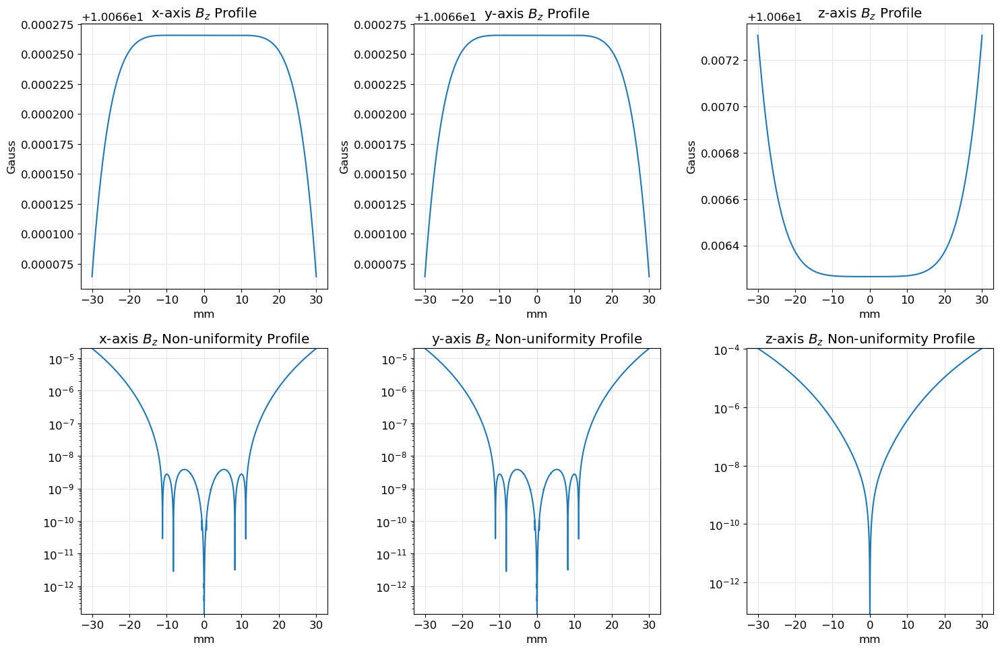

[array([3.41468831e-09, 1.00662657e+01, 1.39338163e+01, 1.60980807e+01,
       2.48949037e+00, 1.90748702e+02, 1.46026576e+02, 9.96220472e+00,
       7.78095180e+00, 1.97006309e+02, 1.80371218e+01, 9.18925991e+00,
       3.37226829e+00, 2.22733189e+02, 1.06671211e+02, 9.98618377e+00,
       1.27330873e+01, 2.17270811e+02])]
[10.066265666149437]


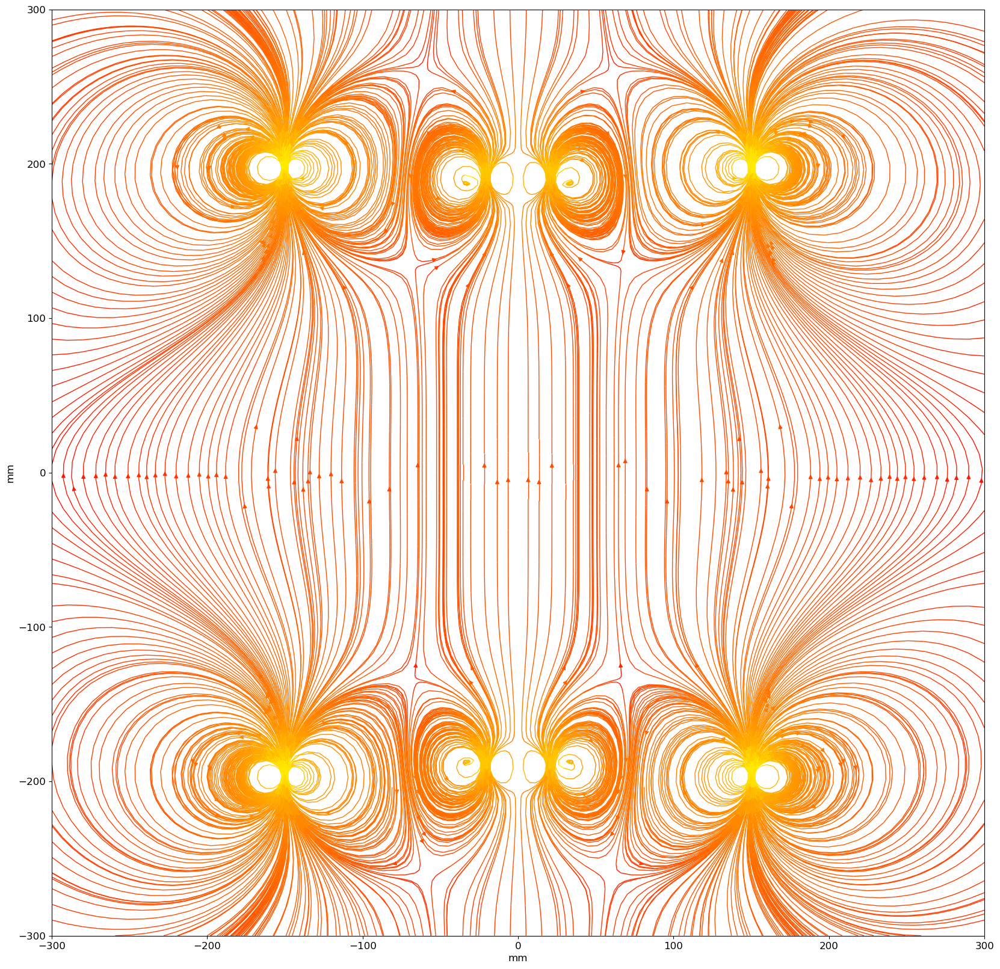

In [4]:
from maggeometry import n_rings, three_rings
grid_res = 101
grid = make_xy_grid([-10, 10], [-10, 10], grid_res)
results2_nonun = []
results2_g_center = []
results2_x = [st1[0]]
for x in results2_x:
#     innerrad1, width1, thickness1, innerrad2, width2, thickness2, dist2 = x
    obj_ring_config=[[*ringset_1_config, *x[2:6]], [*ringset_2_config, *x[6:10]]]
    magnets = n_rings(obj_ring_config)
    grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
#     results2_nonun.append(obj1_nonuniformity(x))
    results2_g_center.append(center_field)
    sens_len = 30
    get_field_on_axes(magnets, [[-sens_len, sens_len], [-sens_len, sens_len], [-sens_len, sens_len]], True)

    x_bounds = [-300, 300]
    z_bounds = [-300, 300]
    make_flux_stream(magnets, x_bounds, z_bounds, [])
print(results2_x)
# print(results2_fun)
# print(results2_nonun)
print(results2_g_center)

In [5]:
from maghelper import get_cuboid_nonuniformity_coverage
d = 50
h = 50
b = 50
v_uni = get_cuboid_nonuniformity_coverage(magnets, [-d, d], [-b, b], [-h, h], 101)

Proportion of uniform region (<1e-6) in central 100 * 100 * 100 = 1000000 mm^3: 1.192%
Volume of uniform region (<1e-6): 11917.876 mm^3 = 11.918 cm^3


In [11]:
v_uni / (np.pi* (st1[0][6]+st1[0][7])**2 * (st1[0][8] + 2*st1[0][9])) *100

0.038802463179285256

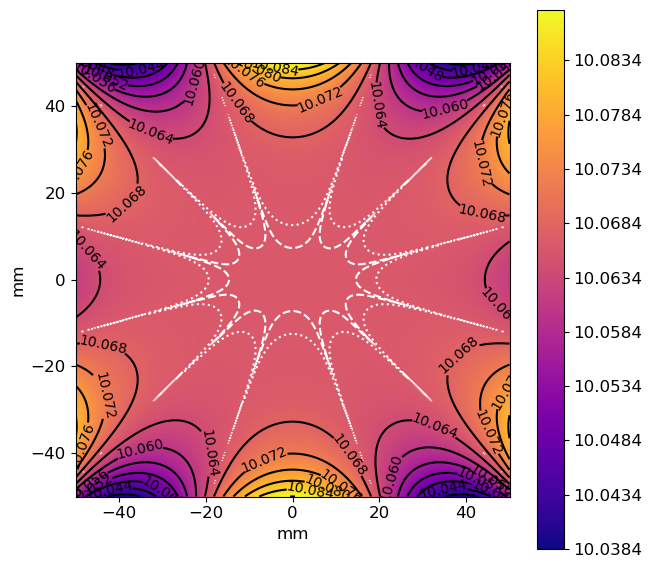

In [12]:
from maghelper import plot_uniform_region_side_view
plot_uniform_region_side_view(magnets, [-d, d], [-h, h])